In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from torchinfo import summary

In [2]:
transform = transforms.Compose([
        #transforms.Resize(256),
        #transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

In [3]:
batch_size = 64

nottestset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)

generator1 = torch.Generator().manual_seed(5)

trainset, validationset = torch.utils.data.random_split(nottestset, [0.8, 0.2], generator=generator1)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

validationloader = torch.utils.data.DataLoader(validationset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


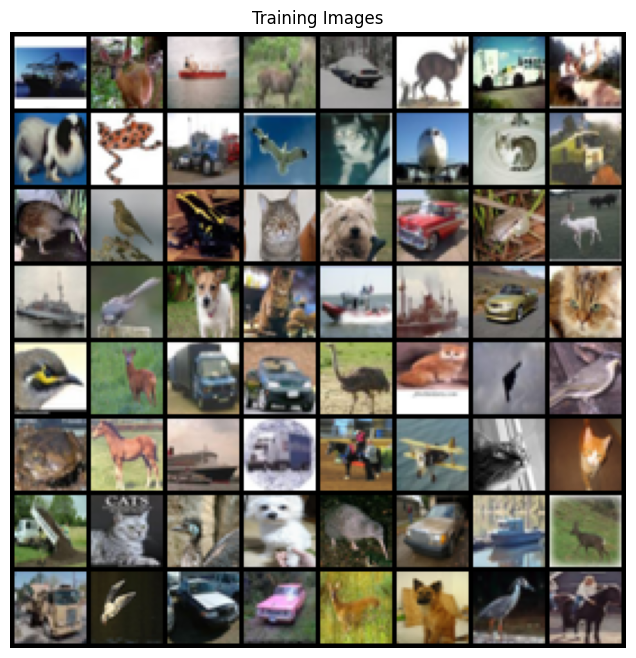

In [14]:
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True),(1,2,0)))
plt.show()

In [11]:
nz = 100
ngf = 32
ndf = 32
nc=3


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=True),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=True),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=True),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=True),
            nn.Tanh()
            # state size. ``(nc) x 32 x 32``
        )

    def forward(self, input):
        return self.main(input)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 32 x 32``
            nn.Conv2d(nc, ndf, 3, 2, 1, bias=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 16 x 16``
            nn.Conv2d(ndf, ndf * 2, 3, 2, 1, bias=True),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 8 x 8``
            nn.Conv2d(ndf * 2, ndf * 4, 3, 2, 1, bias=True),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 4 x 4``
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=True),
            nn.Sigmoid()
            # state size. ``(ndf*4) x 1 x 1``
        )

    def forward(self, input):
        return self.main(input)
    


In [5]:
netD = Discriminator()
netG = Generator()

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1))
    (9): Sigmoid()
  )
)

In [48]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1)

fixed_noise_big = torch.randn(8, 64, nz, 1, 1)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

#Dlr = 0.0001
Glr = 0.001
lr = 0.001
# Setup Adam optimizers for both G and D
#optimizerD = torch.optim.Adam(netD.parameters(), lr=Dlr)
optimizerD = torch.optim.SGD(netD.parameters(), lr=lr, momentum=0.9)
optimizerG = torch.optim.Adam(netG.parameters(), lr=Glr)
#optimizerG = torch.optim.SGD(netG.parameters(), lr=lr)

In [90]:
b_size = batch_size

# Training Loop
num_epochs = 100

# Lists to keep track of progress
img_list = []
gens = []
big_gens = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0]
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 200 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(trainloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 5000 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            gens.append(fake)
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        if (iters == 0) or (iters == np.round(num_epochs * len(trainloader) / 2)):
            with torch.no_grad():
                big_fake = netG(fixed_noise_big[0]).detach().cpu()
                for noise in fixed_noise_big[1:]:
                    big_fake = torch.cat((big_fake, netG(noise).detach().cpu()), 0)
            big_gens.append(big_fake)
                

        iters += 1

Starting Training Loop...
[0/100][0/625]	Loss_D: 0.4277	Loss_G: 4.6851	D(x): 0.7566	D(G(z)): 0.0549 / 0.0278
[0/100][200/625]	Loss_D: 0.6569	Loss_G: 2.9960	D(x): 0.9409	D(G(z)): 0.3826 / 0.0839
[0/100][400/625]	Loss_D: 0.1739	Loss_G: 2.8239	D(x): 0.9533	D(G(z)): 0.1032 / 0.0955
[0/100][600/625]	Loss_D: 0.5421	Loss_G: 2.6880	D(x): 0.7864	D(G(z)): 0.1836 / 0.1097
[1/100][0/625]	Loss_D: 1.1427	Loss_G: 2.8028	D(x): 0.4625	D(G(z)): 0.0588 / 0.1441
[1/100][200/625]	Loss_D: 0.2530	Loss_G: 3.9776	D(x): 0.9110	D(G(z)): 0.0941 / 0.0574
[1/100][400/625]	Loss_D: 1.1005	Loss_G: 1.8758	D(x): 0.9826	D(G(z)): 0.5620 / 0.2387
[1/100][600/625]	Loss_D: 0.6291	Loss_G: 1.3985	D(x): 0.9672	D(G(z)): 0.3917 / 0.3068
[2/100][0/625]	Loss_D: 0.4829	Loss_G: 2.8248	D(x): 0.9028	D(G(z)): 0.2681 / 0.1512
[2/100][200/625]	Loss_D: 0.2771	Loss_G: 3.1814	D(x): 0.8416	D(G(z)): 0.0781 / 0.0678
[2/100][400/625]	Loss_D: 0.2698	Loss_G: 3.2742	D(x): 0.9454	D(G(z)): 0.1638 / 0.0839
[2/100][600/625]	Loss_D: 0.2449	Loss_G: 4.113

In [85]:
big_gens[1].shape

torch.Size([512, 3, 32, 32])

In [110]:
with torch.no_grad():
    final_gen = gens[-1].detach()
    output = model(final_gen)
    c = torch.max(torch.softmax(output, 1), 1)
    confidence = c.values
    class_label = np.asarray(classes)[c.indices]
    print(class_label, confidence)
    

['deer' 'deer' 'bird' 'deer' 'bird' 'car' 'bird' 'dog' 'deer' 'plane'
 'frog' 'deer' 'deer' 'horse' 'horse' 'cat' 'bird' 'dog' 'truck' 'cat'
 'deer' 'deer' 'bird' 'deer' 'deer' 'cat' 'bird' 'deer' 'deer' 'dog'
 'bird' 'bird' 'plane' 'ship' 'cat' 'deer' 'bird' 'deer' 'bird' 'bird'
 'deer' 'frog' 'bird' 'bird' 'deer' 'cat' 'deer' 'plane' 'frog' 'truck'
 'cat' 'bird' 'bird' 'frog' 'frog' 'bird' 'bird' 'dog' 'deer' 'cat' 'bird'
 'bird' 'bird' 'car'] tensor([0.9312, 0.9940, 0.6673, 0.9880, 0.6080, 0.9698, 0.8563, 0.9773, 0.9495,
        0.7767, 0.4264, 0.7254, 0.9831, 0.9946, 0.7891, 0.5793, 0.8547, 0.9682,
        0.3889, 0.9847, 0.9202, 0.8773, 0.4885, 0.9996, 0.9995, 0.9976, 0.6786,
        0.8888, 0.9097, 0.9914, 0.9963, 0.9979, 0.9840, 0.5618, 0.5636, 0.9323,
        0.9922, 0.9958, 0.9993, 0.9998, 0.6625, 0.6756, 0.6054, 1.0000, 0.8994,
        0.7087, 0.8060, 0.8942, 0.6378, 0.9578, 0.8813, 0.9981, 0.9987, 0.4641,
        0.6446, 0.9872, 0.9981, 0.9928, 0.7166, 0.3031, 0.8908, 0.8342

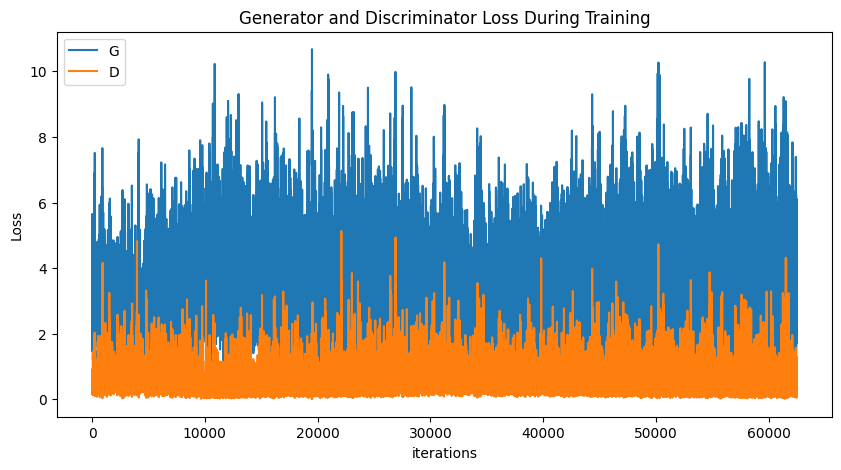

In [91]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
img_list

In [43]:
img_list[0].size()

torch.Size([3, 274, 274])

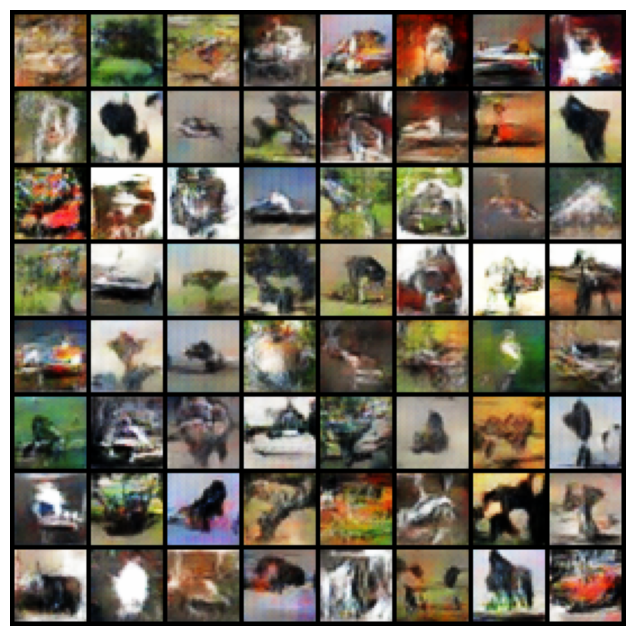

In [93]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [126]:
with torch.no_grad():
    final_gen = big_gens[0].detach()
    output = model(final_gen)
    c = torch.max(torch.softmax(output, 1), 1)
    confidence = np.asarray(c.values)
    class_label = np.asarray(classes)[c.indices]
    print(confidence.mean())
    print(np.unique(class_label, return_counts=True))

0.8777057
(array(['bird', 'cat', 'deer', 'dog', 'horse', 'plane', 'truck'],
      dtype='<U5'), array([229,   2, 261,   1,   5,   5,   9], dtype=int64))


In [127]:
with torch.no_grad():
    final_gen = big_gens[1].detach()
    output = model(final_gen)
    c = torch.max(torch.softmax(output, 1), 1)
    confidence = np.asarray(c.values)
    class_label = np.asarray(classes)[c.indices]
    print(confidence.mean())
    print(np.unique(class_label, return_counts=True))

0.87195075
(array(['bird', 'car', 'cat', 'deer', 'dog', 'frog', 'horse', 'plane',
       'ship', 'truck'], dtype='<U5'), array([173,  11,   5, 231,   9,  19,   7,   6,  19,  32], dtype=int64))


In [130]:
with torch.no_grad():
    big_fake = netG(fixed_noise_big[0]).detach().cpu()
    for noise in fixed_noise_big[1:]:
        big_fake = torch.cat((big_fake, netG(noise).detach().cpu()), 0)
    final_gen = big_fake.detach().cpu()
    output = model(final_gen)
    c = torch.max(torch.softmax(output, 1), 1)
    confidence = np.asarray(c.values)
    class_label = np.asarray(classes)[c.indices]
    print(confidence.mean())
    print(np.unique(class_label, return_counts=True))

0.8428786
(array(['bird', 'car', 'cat', 'deer', 'dog', 'frog', 'horse', 'plane',
       'ship', 'truck'], dtype='<U5'), array([191,  36,  21, 150,  14,  42,  15,   8,   4,  31], dtype=int64))


In [8]:
from torchvision.models import squeezenet1_1, SqueezeNet1_1_Weights

In [97]:
model = squeezenet1_1(weights=SqueezeNet1_1_Weights.DEFAULT) 
sq_transform = torchvision.models.SqueezeNet1_1_Weights.DEFAULT.transforms()

model.classifier = torch.nn.Sequential(
                        torch.nn.AdaptiveAvgPool2d(1),
                        torch.nn.Flatten(),
                        torch.nn.Linear(in_features=512, 
                            out_features=10,
                            bias=True))

for param in model.parameters():
    param.requires_grad = False
for param in model.classifier.parameters():
    param.requires_grad = True
for param in model.features[9:].parameters():
    param.requires_grad = True
    
batch_size = 4

sq_nottestset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=sq_transform)
generator1 = torch.Generator().manual_seed(5)

sq_trainset, sq_validationset = torch.utils.data.random_split(sq_nottestset, [0.8, 0.2], generator=generator1)

sq_trainloader = torch.utils.data.DataLoader(sq_trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

sq_validationloader = torch.utils.data.DataLoader(sq_validationset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

sq_testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=sq_transform)
sq_testloader = torch.utils.data.DataLoader(sq_testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)
    
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)

for epoch in range(1):

    running_loss = 0.0
    for i, data in enumerate(sq_trainloader, 0):
        inputs, labels = data

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:
            print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
            running_loss = 0.0

print('Finished Training')

correct = 0
total = 0


Files already downloaded and verified
Files already downloaded and verified
[1,  2000] loss: 1.124
[1,  4000] loss: 0.668
[1,  6000] loss: 0.559
[1,  8000] loss: 0.503
[1, 10000] loss: 0.494
Finished Training


In [98]:
with torch.no_grad():
    for data in sq_testloader:
        images, labels = data
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test set: {100 * correct // total} %')

Accuracy of the network on the test set: 83 %



(dot.exe:3416): Pango-WARNING **: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.

(dot.exe:8660): Pango-WARNING **: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


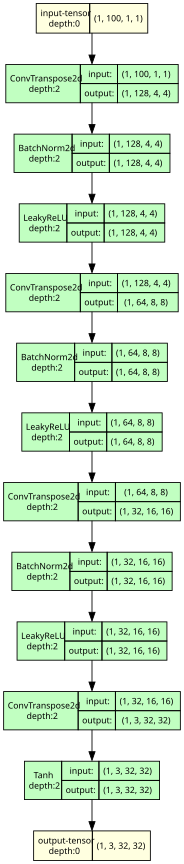

In [16]:
from torchview import draw_graph

model_graph = draw_graph(netG, input_size=(1,nz,1,1), expand_nested=False,  save_graph=True)
model_graph.visual_graph


(dot.exe:13356): Pango-WARNING **: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.

(dot.exe:15072): Pango-WARNING **: couldn't load font "Linux libertine Not-Rotated 10", falling back to "Sans Not-Rotated 10", expect ugly output.


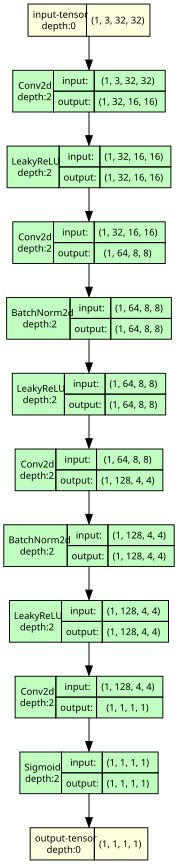

In [15]:
model_graph = draw_graph(netD, input_size=(1,nc,32,32), expand_nested=False,  save_graph=True)
model_graph.visual_graph